# Recruit Restaurant Visitor Forecasting

Predict how many future visitors a restaurant will receive

## Introduction 

미래의 식당 고객 예측 (time series forecasting) 

일본 2개의 웹사이트에서 나온 8개의 파일로 이루어진 일식당 데이터 
* Hot Pepper Gourment (hpg) : similar to Yelp, here users can search restaurants and also make a reservation online
* AirREGI / Restaurant Board (air): similar to Square, a reservation control and cash register system

Train data set : 01/2016 ~ 04/2017
* 식당이 열지 않은 날은 제외 
<br>

Test data set : 04/2016 ~ 05/2016 
* __public, private 순서이고 "Gloden Week"이 포함된 주__
* 식당이 열지않아 손님이 없는 날은 점수 산정에서 제외 

8개의 파일 

__air_reserve.csv & hpg_reserve.csv__

: air & hpg 레스토랑 예약 시스템
* `air_store_id` or `hpg_store_id` - the restaurant's id in the air system
* `visit_datetime` - the time of the reservation
* `reserve_datetime` - the time the reservation was made
* `reserve_visitors` - the number of visitors for that reservation

__air_store_info.csv & hpg_store_info.csv__
: air & hpg 레스토랑 세부 정보
* `air_store_id` & `hpg_store_id`
* `air_genre_name`
* `air_area_name`
* `latitude`
* `longitude`

__store_id_relation.csv__
: air & hpg id

__date_info.csv__
: 일본 공휴일 정보

__sample_submission.csv__
: test set으로 사용. ’id’는 `air_store_id`와 `visit_date`를 결합하여 생성

__date_info.csv__
: This file gives basic information about the calendar dates in the dataset.
* `calendar_date`
* `day_of_week`
* `holiday_flg` : is the day a holiday in Japan

File Descriptions
This is a relational dataset from two systems. Each file is prefaced with the source (either air_ or hpg_) to indicate its origin. Each restaurant has a unique air_store_id and hpg_store_id. Note that not all restaurants are covered by both systems, and that you have been provided data beyond the restaurants for which you must forecast. Latitudes and Longitudes are not exact to discourage de-identification of restaurants.

# 라이브러리 & 파일 불러오기 

In [2]:
import pandas as pd
import numpy as np
import matplotlib.dates as mdates
import datetime as dt
import matplotlib.pyplot as plt
import datetime as dt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [3]:
air_visit = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_visit_data.csv')
air_reserve = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_reserve.csv')
hpg_reserve  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/hpg_reserve.csv')
air_store = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_store_info.csv')
hpg_store  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/hpg_store_info.csv')
holidays  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/date_info.csv')
store_ids  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/store_id_relation.csv')
test  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/sample_submission.csv')

# Air Visit 시각화 

`day`, `day of week`, `month`, `year` 변수 만들어서 어떤 년, 월, 일에 사람들이 많이 예약하는가 알아보기 

In [4]:
air_visit = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_visit_data.csv')

In [5]:
air_visit.head()

,air_store_id,visit_date,visitors
0,air_ba937bf13d40fb24,2016-01-13,25
1,air_ba937bf13d40fb24,2016-01-14,32
2,air_ba937bf13d40fb24,2016-01-15,29
3,air_ba937bf13d40fb24,2016-01-16,22
4,air_ba937bf13d40fb24,2016-01-18,6


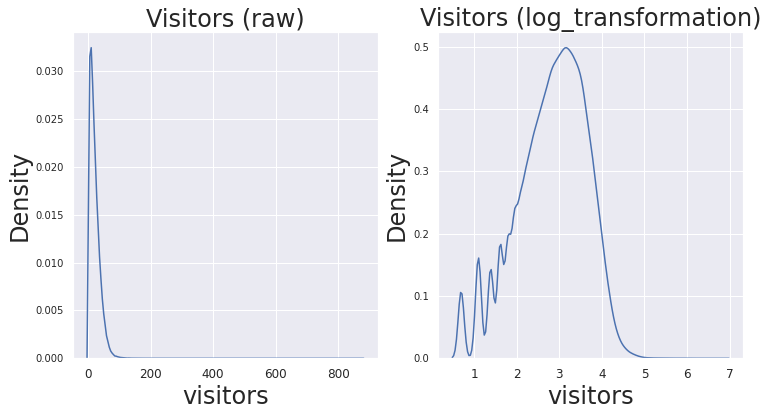

In [35]:
fig = plt.figure(figsize = (12, 6))
gs = fig.add_gridspec(1, 2)
plt.rc('xtick', labelsize=12) 

f_ax1 = fig.add_subplot(gs[0, 0])
sns.kdeplot(air_visit['visitors'])
plt.title('Visitors (raw)')

f_ax2 = fig.add_subplot(gs[-1, -1])
visitors_log_t = np.log1p(air_visit['visitors'])
sns.kdeplot(visitors_log_t)
plt.title('Visitors (log_transformation)')
plt.show()

## 변수 생성
`day`, `day of week`, `month`, `year` 변수 생성

In [6]:
import datetime as dt

air_visit['visit_date'] = pd.to_datetime(air_visit['visit_date'])
air_visit['day'] = air_visit['visit_date'].dt.day_name()
air_visit['dow'] = air_visit['visit_date'].dt.dayofweek
air_visit['month'] = air_visit['visit_date'].dt.month
air_visit['year'] = air_visit['visit_date'].dt.year

air_visit['visit_date'] = air_visit['visit_date'].dt.date

air_visit.head()

,air_store_id,visit_date,visitors,day,dow,month,year
0,air_ba937bf13d40fb24,2016-01-13,25,Wednesday,2,1,2016
1,air_ba937bf13d40fb24,2016-01-14,32,Thursday,3,1,2016
2,air_ba937bf13d40fb24,2016-01-15,29,Friday,4,1,2016
3,air_ba937bf13d40fb24,2016-01-16,22,Saturday,5,1,2016
4,air_ba937bf13d40fb24,2016-01-18,6,Monday,0,1,2016


## 그래프 


Text(0, 0.5, 'Visitors')

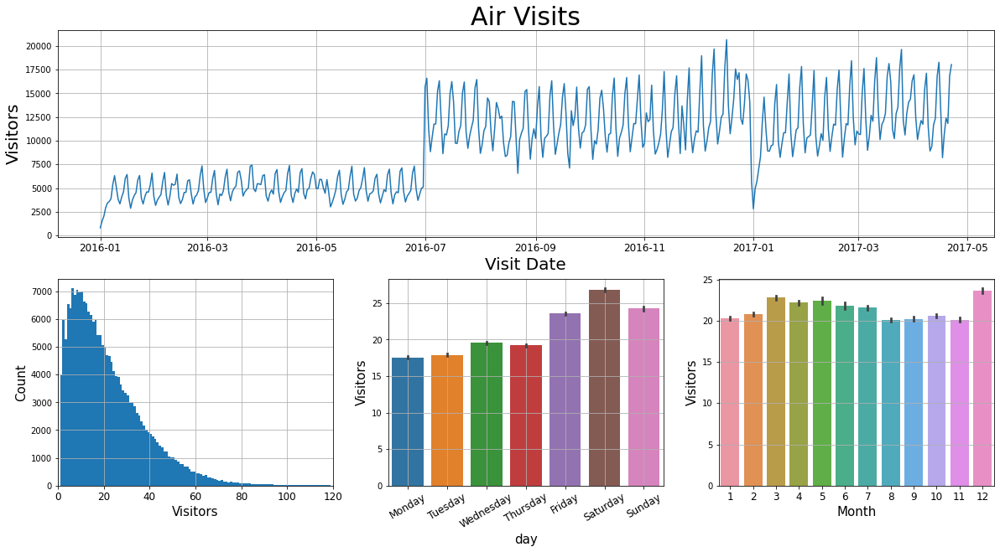

In [7]:
fig = plt.figure(figsize = (20, 10))
gs = fig.add_gridspec(2, 3)
plt.rc('xtick', labelsize=12) 

f_ax1 = fig.add_subplot(gs[0, :])
air_visit.groupby(['visit_date'])['visitors'].sum().plot()
plt.grid()
plt.xlabel('Visit Date', fontsize = 20)
plt.ylabel('Visitors', fontsize = 20) # x축 눈금 폰트 크기 
plt.title('Air Visits', fontsize = 30)

f_ax2 = fig.add_subplot(gs[1, 0])
plt.hist(air_visit['visitors'], bins = range(1, 120, 1))
plt.grid()
plt.xlim([0, 120])
plt.xlabel('Visitors',fontsize = 15)
plt.ylabel('Count',fontsize = 15)

f_ax3 = fig.add_subplot(gs[1, 1])
sns.barplot(data = air_visit, 
            x = 'day', y = 'visitors', 
            order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.grid()
plt.xticks(rotation=30)
plt.xlabel('day',fontsize = 15)
plt.ylabel('Visitors',fontsize = 15)

f_ax4 = fig.add_subplot(gs[1, -1])
plt.grid()
sns.barplot(data = air_visit, 
            x = 'month', y = 'visitors')
plt.xlabel('Month',fontsize = 15)
plt.ylabel('Visitors',fontsize = 15)

1. 2016년 7월부터 방문자 수 급증, 2016년 연말엔 방문자 수 급격하게 줄어듦. (16년도 7월쯤에 데이터가 추가 됨.)
2. 매장별 일 방문 고객수가 10명 근처인 곳이 가장 많은 것으로 보인다.  
3. 평일 중에서도 월, 화가 가장 방문자가 적고, 금, 토, 일은 방문자가 많음. 특히 __토요일__에 방문자 수 많은 것을 볼 수 있음
4. 12월달 방문자가 가장 많고, 3,4,5월은 꾸준하게 많은 방문자를 보임 

# __Air Reserve__ 시각화 


In [8]:
air_reserve = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_reserve.csv')

In [9]:
air_reserve.head()

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01 19:00:00,2016-01-01 16:00:00,1
1,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,3
2,air_db4b38ebe7a7ceff,2016-01-01 19:00:00,2016-01-01 19:00:00,6
3,air_877f79706adbfb06,2016-01-01 20:00:00,2016-01-01 16:00:00,2
4,air_db80363d35f10926,2016-01-01 20:00:00,2016-01-01 01:00:00,5


## 변수생성
방문하기 얼마 전에 예약을 하는지 알아보기 위해 `diff_time` 변수와 방문하고자 하는 시간대를 알아보기 위해 `visit_hour` 변수 생성

In [10]:
air_reserve['visit_datetime'] = pd.to_datetime(air_reserve['visit_datetime'])
air_reserve['reserve_datetime'] = pd.to_datetime(air_reserve['reserve_datetime'])
air_reserve['visit_hour'] = air_reserve['visit_datetime'].dt.hour

air_reserve['diff_time'] = air_reserve['visit_datetime']-air_reserve['reserve_datetime']
air_reserve['diff_time'] = air_reserve['diff_time']/ np.timedelta64(1, 'h')

In [11]:
air_reserve['visit_datetime'] = air_reserve['visit_datetime'].dt.date
air_reserve['reserve_datetime'] = air_reserve['reserve_datetime'].dt.date

air_reserve.head()

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors,visit_hour,diff_time
0,air_877f79706adbfb06,2016-01-01,2016-01-01,1,19,3.0
1,air_db4b38ebe7a7ceff,2016-01-01,2016-01-01,3,19,0.0
2,air_db4b38ebe7a7ceff,2016-01-01,2016-01-01,6,19,0.0
3,air_877f79706adbfb06,2016-01-01,2016-01-01,2,20,4.0
4,air_db80363d35f10926,2016-01-01,2016-01-01,5,20,19.0


## 그래프

Text(0, 0.5, 'Count')

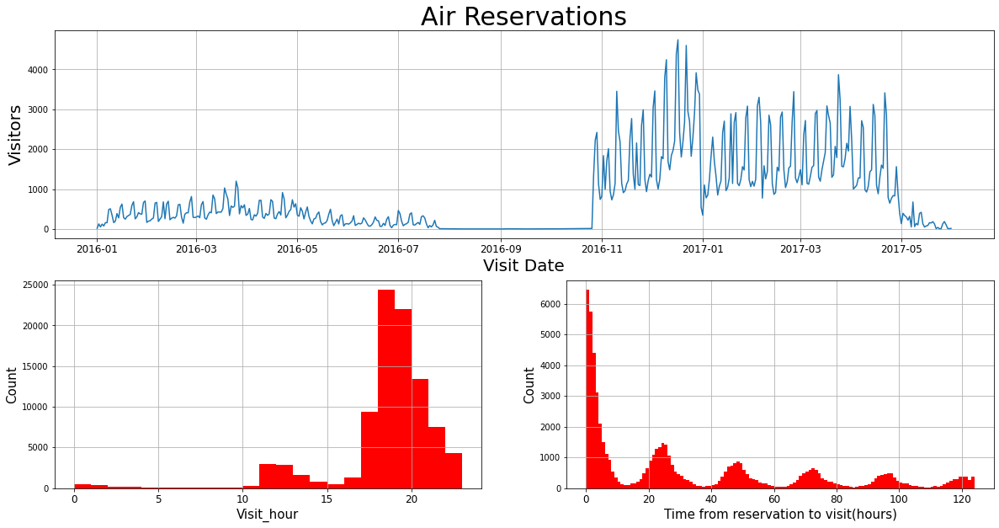

In [12]:
fig = plt.figure(figsize = (20, 10))
gs = fig.add_gridspec(2, 2)
plt.rc('xtick', labelsize=12) 

f_ax1 = fig.add_subplot(gs[0, :])
air_reserve.groupby(['visit_datetime'])['reserve_visitors'].sum().plot()
plt.grid()
plt.xlabel('Visit Date', fontsize = 20)
plt.ylabel('Visitors', fontsize = 20)
plt.title('Air Reservations', fontsize = 30)

f_ax2 = fig.add_subplot(gs[1, 0])
plt.hist(air_reserve['visit_hour'], bins = range(0, 24, 1), color='r')
plt.grid()
plt.xlabel('Visit_hour',fontsize = 15)
plt.ylabel('Count',fontsize = 15)

f_ax3 = fig.add_subplot(gs[1, 1])
plt.hist(air_reserve['diff_time'], bins = range(0, 125, 1), color='r')
plt.grid()
plt.xlabel('Time from reservation to visit(hours)',fontsize = 15)
plt.ylabel('Count',fontsize = 15)


1. 2016년도의 예약은 저조하고 긴시간 예약이 없는 구간도 있음. 16년 연말 동안 예약이 증가함. 17년도 예약한 고객수는 꾸준하게 유지되고 1분기 이후의 감소는 training time이 끝나는 시기의 예약과 연관되어 보임.

2. 방문하는 시간대는 보통 저녁시간임

3. 방문 몇 시간 전 예약하는 경우가 가장 많고, 다음날 저녁에 방문하기 위해 그날 저녁에 예약하는 경우가 많음. 예외적으로 오래전에 예약하는 케이스들도 있음.

# Hpg Reserve 시각화 


In [13]:
hpg_reserve  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/hpg_reserve.csv')

In [14]:
hpg_reserve  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/hpg_reserve.csv')
hpg_reserve.head()
hpg_reserve.tail()

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors
2000315,hpg_2b293477ea4642fb,2017-05-31 20:00:00,2017-04-19 07:00:00,2
2000316,hpg_f922aeca48ca5a29,2017-05-31 20:00:00,2017-03-19 00:00:00,3
2000317,hpg_e9151de687b93aa3,2017-05-31 21:00:00,2017-04-14 20:00:00,49
2000318,hpg_fae6c96189b4a122,2017-05-31 21:00:00,2017-04-19 17:00:00,9
2000319,hpg_0b70de808b55ad1e,2017-05-31 23:00:00,2017-04-21 13:00:00,6


## 변수생성
방문하기 얼마 전에 예약을 하는지 알아보기 위해 `diff_time` 변수와 방문하고자 하는 시간대를 알아보기 위해 `visit_hour` 변수 생성

In [15]:
hpg_reserve['visit_datetime'] = pd.to_datetime(hpg_reserve['visit_datetime'])
hpg_reserve['reserve_datetime'] = pd.to_datetime(hpg_reserve['reserve_datetime'])
hpg_reserve['visit_hour'] = hpg_reserve['visit_datetime'].dt.hour

hpg_reserve['diff_time'] = hpg_reserve['visit_datetime']-hpg_reserve['reserve_datetime']
hpg_reserve['diff_time'] = hpg_reserve['diff_time']/ np.timedelta64(1, 'h')

In [16]:
hpg_reserve['visit_datetime'] = hpg_reserve['visit_datetime'].dt.date
hpg_reserve['reserve_datetime'] = hpg_reserve['reserve_datetime'].dt.date

hpg_reserve.head()

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors,visit_hour,diff_time
0,hpg_c63f6f42e088e50f,2016-01-01,2016-01-01,1,11,2.0
1,hpg_dac72789163a3f47,2016-01-01,2016-01-01,3,13,7.0
2,hpg_c8e24dcf51ca1eb5,2016-01-01,2016-01-01,2,16,2.0
3,hpg_24bb207e5fd49d4a,2016-01-01,2016-01-01,5,17,6.0
4,hpg_25291c542ebb3bc2,2016-01-01,2016-01-01,13,17,14.0


## 그래프

Text(0, 0.5, 'Count')

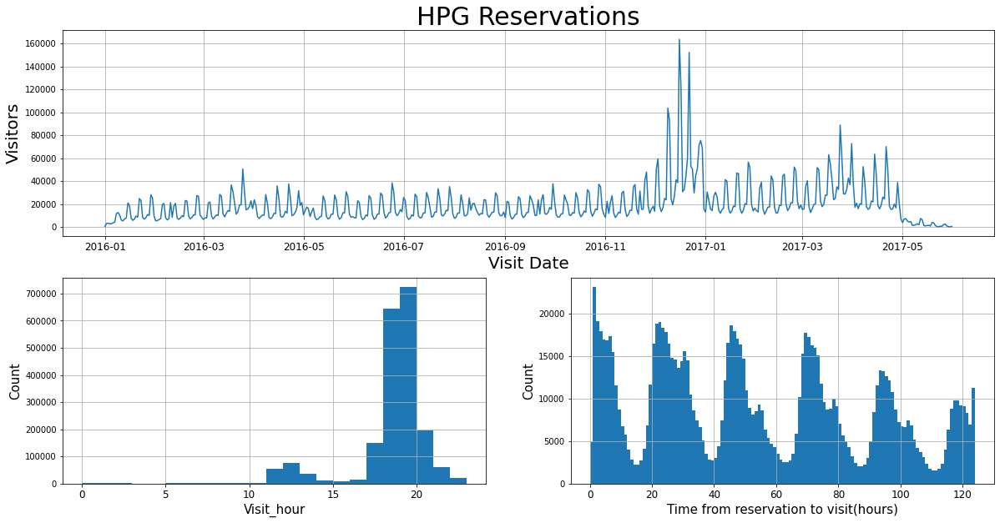

In [17]:
fig = plt.figure(figsize = (20, 10))
gs = fig.add_gridspec(2, 2)
plt.rc('xtick', labelsize=12) 

f_ax1 = fig.add_subplot(gs[0, :])
hpg_reserve.groupby(['visit_datetime'])['reserve_visitors'].sum().plot()
plt.grid()
plt.xlabel('Visit Date', fontsize = 20)
plt.ylabel('Visitors', fontsize = 20)
plt.title('HPG Reservations', fontsize = 30)

f_ax2 = fig.add_subplot(gs[1, 0])
plt.hist(hpg_reserve['visit_hour'], bins = range(0, 24, 1))
plt.grid()
plt.xlabel('Visit_hour',fontsize = 15)
plt.ylabel('Count',fontsize = 15)

f_ax3 = fig.add_subplot(gs[1, 1])
plt.grid()
plt.hist(hpg_reserve['diff_time'], bins = range(0, 125, 1))
plt.xlabel('Time from reservation to visit(hours)',fontsize = 15)
plt.ylabel('Count',fontsize = 15)

1. 2016년도 말에 예약이 급격하게 증가하고 Air Reserve와 비슷한 패턴을 보임
2. 방문하는 시간대는 보통 저녁시간이고 Air Reserve와 비슷한 패턴을 보임
3. Air Reservation은 몇시간 전에 예약하는 경우가 많은 반면, HPG Reservation은 몇 시간 전의 예약이 하루나 이틀전의 예약보다 특출나게 많지않고 24시간의 패턴을 보임 

# Air Store 시각화



In [18]:
print(air_store.info())
air_store.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829 entries, 0 to 828
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   air_store_id    829 non-null    object 
 1   air_genre_name  829 non-null    object 
 2   air_area_name   829 non-null    object 
 3   latitude        829 non-null    float64
 4   longitude       829 non-null    float64
dtypes: float64(2), object(3)
memory usage: 32.5+ KB
None


,air_store_id,air_genre_name,air_area_name,latitude,longitude
0,air_0f0cdeee6c9bf3d7,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
1,air_7cc17a324ae5c7dc,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
2,air_fee8dcf4d619598e,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
3,air_a17f0778617c76e2,Italian/French,Hyōgo-ken Kōbe-shi Kumoidōri,34.695124,135.197852
4,air_83db5aff8f50478e,Italian/French,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599


In [19]:
import folium
from folium import plugins

folium.__version__

'0.8.3'

In [20]:
location = air_store.groupby(['air_store_id', 'air_genre_name'])['latitude', 'longitude'].mean().reset_index()
lacationlist = location[['latitude', 'longitude']]
locationlist = lacationlist.values.tolist()

map = folium.Map(location=[39, 139], 
                        tiles = "Stamen Toner",# width=1000, height=500,
                        zoom_start = 5)
marker_cluster=plugins.MarkerCluster().add_to(map)
for point in range(0, len(location)):
    folium.Marker(locationlist[point], popup=location['air_genre_name'][point], 
    icon=folium.Icon(color='white', icon_color='red', 
                     #icon='fa fa-info-circle',
                     icon='fa fa-circle-o-notch fa-spin',
                     angle=0, 
                     prefix='fa')).add_to(marker_cluster)
map

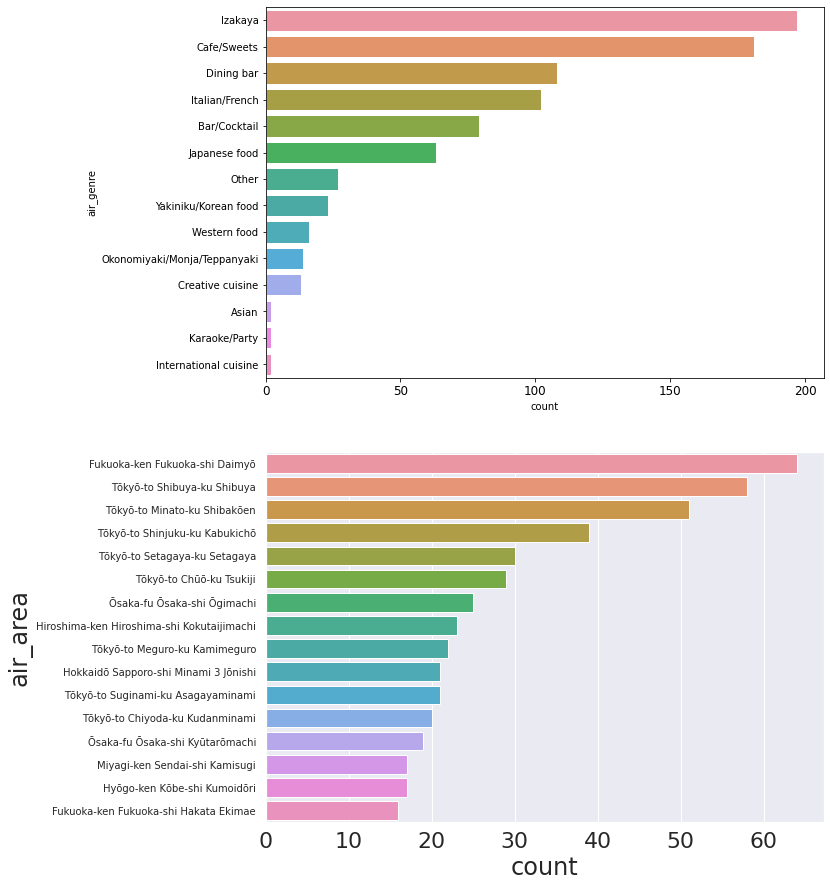

In [21]:
air_genre = air_store["air_genre_name"].value_counts().reset_index()
air_genre = air_genre.rename(columns={"index":"air_genre", "air_genre_name":"count"})

air_area = air_store["air_area_name"].value_counts().reset_index()
air_area = air_area.rename(columns={"index":"air_area", "air_area_name":"count"})

air_area_15 = air_area.loc[:15, :]

plt.figure(figsize=(10, 15))

plt.subplot(2, 1, 1)
area1 = sns.set(font_scale=2) 
area1 = sns.barplot(y = air_genre["air_genre"], x = air_genre["count"])
area1 = plt.rc('ytick', labelsize=10)

plt.subplot(2, 1, 2)
area2 = plt.rc('ytick', labelsize=10)
area2 = sns.barplot(y = air_area_15["air_area"], x = air_area_15["count"])

1. Izakaya, Cafe, Dining Bar가 많이 분포함
2. Fukuoka, Tokyo에 많은 점포들이 있음

# HPG Store 시각화 

In [22]:
hpg_store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4690 entries, 0 to 4689
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   hpg_store_id    4690 non-null   object 
 1   hpg_genre_name  4690 non-null   object 
 2   hpg_area_name   4690 non-null   object 
 3   latitude        4690 non-null   float64
 4   longitude       4690 non-null   float64
dtypes: float64(2), object(3)
memory usage: 183.3+ KB


In [23]:
location = hpg_store.groupby(['hpg_store_id', 'hpg_genre_name'])['latitude', 'longitude'].mean().reset_index()
lacationlist = location[['latitude', 'longitude']]
locationlist = lacationlist.values.tolist()

map = folium.Map(location=[39, 139], 
                        tiles = "Stamen Toner",
                        zoom_start = 5)
marker_cluster=plugins.MarkerCluster().add_to(map)
for point in range(0, len(location)):
    folium.Marker(locationlist[point], popup=location['hpg_genre_name'][point], 
    icon=folium.Icon(color='white', icon_color='red', 
                     icon='fa fa-circle-o-notch fa-spin',
                     angle=0, 
                     prefix='fa')).add_to(marker_cluster)
map

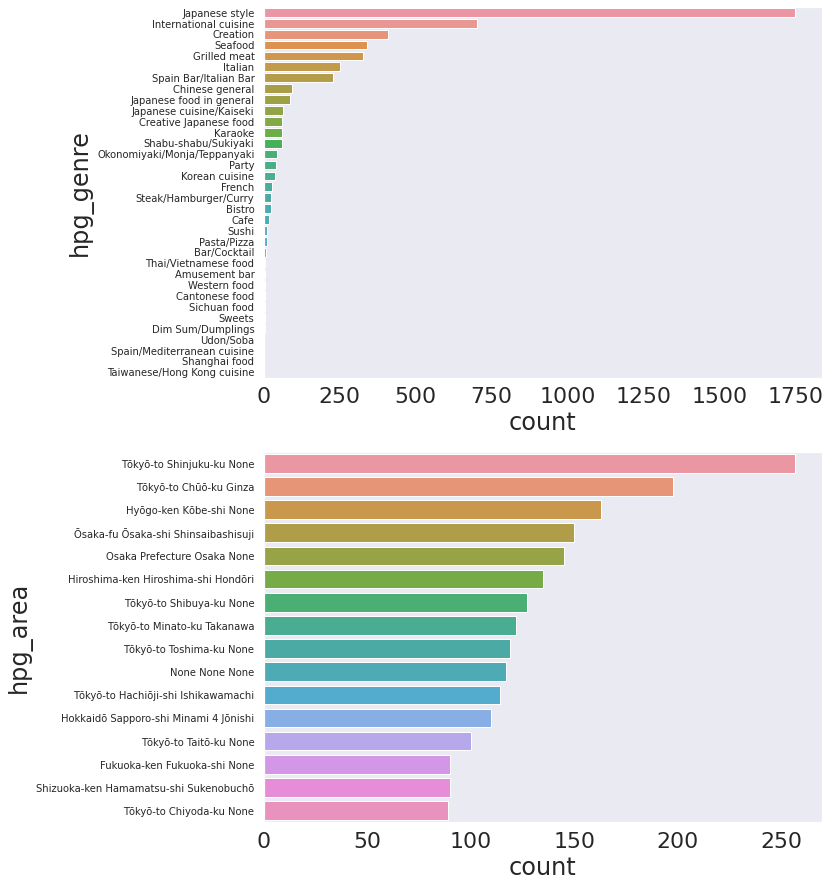

In [24]:
hpg_genre = hpg_store[['hpg_genre_name']]

hpg_genre = hpg_genre["hpg_genre_name"].value_counts().reset_index()
hpg_genre = hpg_genre.rename(columns={"index":"hpg_genre", "hpg_genre_name":"count"})

hpg_area = hpg_store["hpg_area_name"].value_counts().reset_index()
hpg_area = hpg_area.rename(columns={"index":"hpg_area", "hpg_area_name":"count"})

hpg_area_15 = hpg_area.loc[:15, :]

plt.figure(figsize=(10, 15))
plt.rc('ytick', labelsize=10)

plt.subplot(2, 1, 1)
plt.grid()
sns.barplot(y = hpg_genre["hpg_genre"], x = hpg_genre["count"])

plt.subplot(2, 1, 2)
plt.grid()
sns.barplot(y = hpg_area_15["hpg_area"], x = hpg_area_15["count"])

1. Japanese style의 음식점이 독보적으로 많고 International cuisine이 그 다음으로 많음
2. Tokyo와 Osaka에 많은 점포들이 있음

# Holidays 시각화 


In [ ]:
holidays  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/date_info.csv')

In [ ]:
holidays.head()

,calendar_date,day_of_week,holiday_flg
0,2016-01-01,Friday,1
1,2016-01-02,Saturday,1
2,2016-01-03,Sunday,1
3,2016-01-04,Monday,0
4,2016-01-05,Tuesday,0


In [ ]:
holidays['holiday_flg'] = holidays['holiday_flg'].astype(bool)
holidays['calendar_date'] = pd.to_datetime(holidays['calendar_date'])
holidays.head()

,calendar_date,day_of_week,holiday_flg
0,2016-01-01,Friday,True
1,2016-01-02,Saturday,True
2,2016-01-03,Sunday,True
3,2016-01-04,Monday,False
4,2016-01-05,Tuesday,False


## 데이터 셋 합치기 

공휴일과 평일의 분포를 비교하기 위해 Air Visit와 Holiday 데이터 셋을 `calendar_date` 기준으로 합침

(Air_visit에 `calendar_date`변수 생성)

In [ ]:
air_visit['calendar_date'] = pd.to_datetime(air_visit['visit_date'])
holidays['calendar_date'] = pd.to_datetime(holidays['calendar_date'])

In [ ]:
air_holi_visit = pd.merge(holidays, air_visit, how = 'inner', on='calendar_date')
air_holi_visit.head()

,calendar_date,day_of_week,holiday_flg,air_store_id,visit_date,visitors,day,dow,month,year
0,2016-01-01,Friday,True,air_d0e8a085d8dc83aa,2016-01-01,8,Friday,4,1,2016
1,2016-01-01,Friday,True,air_5c65468938c07fa5,2016-01-01,8,Friday,4,1,2016
2,2016-01-01,Friday,True,air_f690c42545146e0a,2016-01-01,7,Friday,4,1,2016
3,2016-01-01,Friday,True,air_09a845d5b5944b01,2016-01-01,56,Friday,4,1,2016
4,2016-01-01,Friday,True,air_d0a7bd3339c3d12a,2016-01-01,62,Friday,4,1,2016


In [ ]:
air_holi_visit2 = pd.merge(holidays, air_visit, how = 'inner', on='calendar_date')

air_holi_visit2['visit_date'] = pd.to_datetime(air_holi_visit2['visit_date'])
air_holi_visit2['dow'] = air_holi_visit2['visit_date'].dt.dayofweek
air_holi_visit2.head()
set(air_holi_visit2['dow'])

air_visit_holidays_mean_0 = air_holi_visit2.query("holiday_flg=='0'")['visitors'].groupby(air_holi_visit2['dow']).mean()
air_visit_holidays_mean_1 = air_holi_visit2.query("holiday_flg=='1'")['visitors'].groupby(air_holi_visit2['dow']).mean()

# dataFrame 으로 변환
s0 = pd.Series(air_visit_holidays_mean_0.values, name='visits_mean')
df_data_0 =s0.to_frame()
df_data_0['holiday_flg'] = '0'

s1 = pd.Series(air_visit_holidays_mean_1.values,  name='visits_mean')
df_data_1 =s1.to_frame()
df_data_1['holiday_flg'] = '1'

air_visit_holidays_mean = pd.concat([df_data_0, df_data_1], axis=0)
air_visit_holidays_mean['dow'] = air_visit_holidays_mean.index


,visits_mean,holiday_flg,dow
0,16.930655,0,0
1,17.779495,0,1
2,19.443355,0,2
3,18.832646,0,3
4,23.399483,0,4
5,26.893442,0,5
6,24.238377,0,6
0,22.256337,1,0
1,27.144186,1,1
2,23.243709,1,2


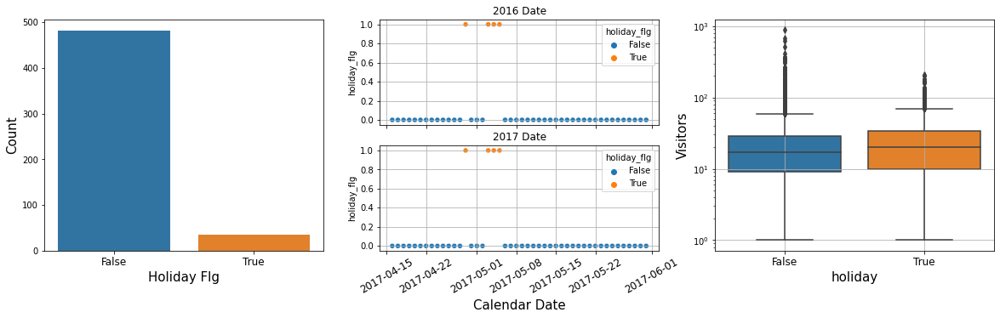

In [ ]:
import plotnine as p9
fig = plt.figure(figsize = (20, 5))
gs = fig.add_gridspec(2, 3)
plt.rc('xtick', labelsize=12) 

f_ax1 = fig.add_subplot(gs[:, 0])
sns.countplot(holidays['holiday_flg'])
g1 = plt.xlabel('Holiday Flg', fontsize=15)
g1 = plt.ylabel('Count', fontsize=15)

f_ax2 = fig.add_subplot(gs[0, 1])
period1 = "calendar_date > '2016-04-15' and calendar_date < '2016-06-01'"
g2 = sns.scatterplot(x="calendar_date", y="holiday_flg",hue='holiday_flg', data=holidays.query(period1))
g2.grid()
g2.set(xticklabels=[])  # remove the tick labels
g2.set(title='2016 Date')  # add a title
g2.set(xlabel=None)  # remove the axis label

f_ax3 = fig.add_subplot(gs[1, 1])
period2 = "calendar_date > '2017-04-15' and calendar_date < '2017-06-01'"
g3 = sns.scatterplot(x="calendar_date", y="holiday_flg",hue='holiday_flg', data=holidays.query(period2))
g3.grid()
g3.set(title='2017 Date')  # add a title
g3 = plt.xlabel('Calendar Date', fontsize=15)
plt.xticks(rotation=30)

f_ax4 = fig.add_subplot(gs[0:, 2])
g4 = sns.boxplot(x = "holiday_flg", y = 'visitors',  data = air_holi_visit)
g4 = plt.grid()
g4 = plt.yscale('log')
g4 = plt.xlabel('holiday', fontsize=15)
g4 = plt.ylabel('Visitors', fontsize=15)

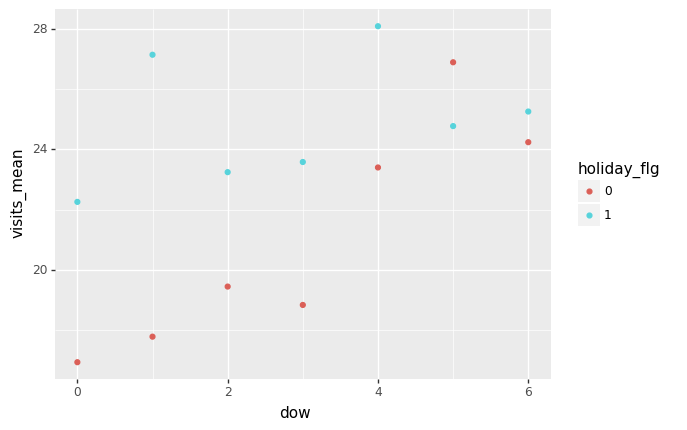

<ggplot: (8775778167725)>

In [ ]:
p9.ggplot(data=air_visit_holidays_mean, mapping=p9.aes(x='dow',y='visits_mean', color='holiday_flg')) + p9.geom_point()

1. 공휴일과 평일의 분포 
2. 2016년도와 2017년도의 공휴일은 같은 것을 볼 수 있음
3. outlier를 제외한 boxplot을 보면 휴일 여부에 따른 방문객 수는 큰 차이가 없음. 자세히 살펴보기 위해 아래 그래프를 보면
4. 공휴일이 주말인 경우는 방문객 수에 큰 영향을 미치지 않지만 휴일이 주중인 경우는 큰 영향을 미치는 걸로 보임(특히, 월요일과 화요일)

# Merge 

ggplot으로 그린 그래프를 파이썬 형식으로 가져오면서 앞으로 우리가 어떻게 분석을 진행할 것인지 같이 설명

__HPG Reserve 데이터 중 Store ID Relation 정보가 있는 데이터 추출__

In [12]:
air_visit = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_visit_data.csv')
air_reserve = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_reserve.csv')
hpg_reserve  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/hpg_reserve.csv')
air_store = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/air_store_info.csv')
hpg_store  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/hpg_store_info.csv')
holidays  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/date_info.csv')
store_ids  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/store_id_relation.csv')
test  = pd.read_csv('/content/drive/MyDrive/aiffel/Hackerton1/sample_submission.csv')

In [13]:
print('Store ID Relation의 데이터 갯수 :', len(store_ids))

print('\nHPG Reserve의 데이터 갯수 :', len(hpg_reserve))

Store ID Relation의 데이터 갯수 : 150

HPG Reserve의 데이터 갯수 : 2000320


In [14]:
hpg_reserve = pd.merge(hpg_reserve, store_ids, how='inner', on=['hpg_store_id'])

print('Inner Merge한 HPG Reserve의 데이터 갯수 :', len(hpg_reserve),'\n')
hpg_reserve.head(1)

Inner Merge한 HPG Reserve의 데이터 갯수 : 28183 



,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors,air_store_id
0,hpg_878cc70b1abc76f7,2016-01-01 19:00:00,2016-01-01 15:00:00,4,air_db80363d35f10926


__Air Reserve, HPG Reserve 시계열 데이터 처리__ 
  * 연월일시 -> 연월일

In [15]:
air_reserve['visit_datetime'] = pd.to_datetime(air_reserve['visit_datetime'])
    # str을 datetime으로 변환
air_reserve['visit_datetime'] = air_reserve['visit_datetime'].dt.date
    # datetime을 dt.date로 변환 
air_reserve['reserve_datetime'] = pd.to_datetime(air_reserve['reserve_datetime'])
    # str을 datetime으로 변환
air_reserve['reserve_datetime'] = air_reserve['reserve_datetime'].dt.date

air_reserve.head(1)

,air_store_id,visit_datetime,reserve_datetime,reserve_visitors
0,air_877f79706adbfb06,2016-01-01,2016-01-01,1


In [16]:
hpg_reserve['visit_datetime'] = pd.to_datetime(hpg_reserve['visit_datetime'])
    # str을 datetime으로 변환
hpg_reserve['visit_datetime'] = hpg_reserve['visit_datetime'].dt.date
    # datetime을 dt.date로 변환 
hpg_reserve['reserve_datetime'] = pd.to_datetime(hpg_reserve['reserve_datetime'])
    # str을 datetime으로 변환
hpg_reserve['reserve_datetime'] = hpg_reserve['reserve_datetime'].dt.date

hpg_reserve.head(1)

,hpg_store_id,visit_datetime,reserve_datetime,reserve_visitors,air_store_id
0,hpg_878cc70b1abc76f7,2016-01-01,2016-01-01,4,air_db80363d35f10926


__Air Reserve과 HPG Reserve 데이터 셋, `air_store_id`와 `visit_datetime`으로 groupby__

In [17]:
air_reserve = air_reserve.groupby(['air_store_id','visit_datetime'], as_index=False)[['reserve_visitors']].sum()
air_reserve = air_reserve.rename(columns={'visit_datetime':'visit_date'})

air_reserve.head(1)

,air_store_id,visit_date,reserve_visitors
0,air_00a91d42b08b08d9,2016-10-31,2


In [18]:
hpg_reserve = hpg_reserve.groupby(['air_store_id','visit_datetime'], as_index=False)[['reserve_visitors']].sum()
hpg_reserve = hpg_reserve.rename(columns={'visit_datetime':'visit_date'})

hpg_reserve.head(1)

,air_store_id,visit_date,reserve_visitors
0,air_00a91d42b08b08d9,2016-01-14,2


__Air Visit 데이터 셋에, `day_of_week`, `month`, `year` 추가__

In [19]:
air_visit['visit_date'] = pd.to_datetime(air_visit['visit_date'])
  # str을 datetime으로 변환
air_visit['dow'] = air_visit['visit_date'].dt.dayofweek
  # 요일을 의미하는 숫자 변수 생성
air_visit['year'] = air_visit['visit_date'].dt.year
  # 년도 year 변수 생성
air_visit['month'] = air_visit['visit_date'].dt.month
  # 달 month 변수 생성
air_visit['visit_date'] = air_visit['visit_date'].dt.date
  # datetime을 dt.date로 변환
air_visit.head(1)

,air_store_id,visit_date,visitors,dow,year,month
0,air_ba937bf13d40fb24,2016-01-13,25,2,2016,1


__Sample Submission에 `day_of_week`, `month`, `year` 추가__



In [20]:
test['visit_date'] = test['id'].map(lambda x: str(x).split('_')[2])
  # id 변수에서 날짜를 뽑아와 visit_date 변수 생성
test['air_store_id'] = test['id'].map(lambda x: '_'.join(x.split('_')[:2]))
  # id 변수에서 store id를 뽑아와 air_store_id 변수 생성
test['visit_date'] = pd.to_datetime(test['visit_date'])
  # str을 datetime으로 변환
test['dow'] = test['visit_date'].dt.dayofweek
  # 요일을 의미하는 숫자 변수 생성
test['year'] = test['visit_date'].dt.year
  # 년도 year 변수 생성
test['month'] = test['visit_date'].dt.month
  # 달 month 변수 생성
test['visit_date'] = test['visit_date'].dt.date
  # datetime을 dt.date로 변환

test.head(1)

,id,visitors,visit_date,air_store_id,dow,year,month
0,air_00a91d42b08b08d9_2017-04-23,0,2017-04-23,air_00a91d42b08b08d9,6,2017,4


__요일별 통계를 위한 Stores 데이터 셋__

In [21]:
unique_stores = test['air_store_id'].unique() # air_store id만을 뽑아낸다.

# 일주일에 해당하는 만큼 unique_stores x 7
stores = pd.concat([pd.DataFrame({'air_store_id': unique_stores, 
                                  'dow': [i] * len(unique_stores)}) for i in range(7)], 
                   axis=0, 
                   ignore_index=True).reset_index(drop=True)

print('Store의 데이터 수 :', len(stores))
stores.head(1)

Store의 데이터 수 : 5747


,air_store_id,dow
0,air_00a91d42b08b08d9,0


__가게의 '요일별' visitors의 산술 통계량 계산__

In [22]:
tmp = air_visit.groupby(['air_store_id','dow'], as_index=False)['visitors'].min().rename(columns={'visitors':'min_visitors'})
stores = pd.merge(stores, tmp, how='left', on=['air_store_id','dow']) 
tmp = air_visit.groupby(['air_store_id','dow'], as_index=False)['visitors'].mean().rename(columns={'visitors':'mean_visitors'})
stores = pd.merge(stores, tmp, how='left', on=['air_store_id','dow'])
tmp = air_visit.groupby(['air_store_id','dow'], as_index=False)['visitors'].median().rename(columns={'visitors':'median_visitors'})
stores = pd.merge(stores, tmp, how='left', on=['air_store_id','dow'])
tmp = air_visit.groupby(['air_store_id','dow'], as_index=False)['visitors'].max().rename(columns={'visitors':'max_visitors'})
stores = pd.merge(stores, tmp, how='left', on=['air_store_id','dow'])
tmp = air_visit.groupby(['air_store_id','dow'], as_index=False)['visitors'].count().rename(columns={'visitors':'count_observations'})
stores = pd.merge(stores, tmp, how='left', on=['air_store_id','dow']) 

stores.head(1)

,air_store_id,dow,min_visitors,mean_visitors,median_visitors,max_visitors,count_observations
0,air_00a91d42b08b08d9,0,1.0,22.457143,19.0,47.0,35.0


__Store(요일별 통계량) 데이터 셋과 Air Store Info 데이터셋 merge__


In [23]:
stores = pd.merge(stores, air_store, how='left', on=['air_store_id']) 
stores.head(1)

,air_store_id,dow,min_visitors,mean_visitors,median_visitors,max_visitors,count_observations,air_genre_name,air_area_name,latitude,longitude
0,air_00a91d42b08b08d9,0,1.0,22.457143,19.0,47.0,35.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595


__연휴 데이터 전처리, LabelEncoding__

In [24]:
holidays = holidays.rename(columns={'calendar_date':'visit_date'})
holidays.head(1)

,visit_date,day_of_week,holiday_flg
0,2016-01-01,Friday,1


In [25]:
 from sklearn import preprocessing
lbl = preprocessing.LabelEncoder()

holidays['visit_date'] = pd.to_datetime(holidays['visit_date'])
holidays['day_of_week'] = lbl.fit_transform(holidays['day_of_week'])
holidays['visit_date'] = holidays['visit_date'].dt.date
holidays.head(1)

,visit_date,day_of_week,holiday_flg
0,2016-01-01,0,1


__Air Visit 데이터 셋에 Holidays 데이터(date_info) merge__

In [26]:
air_visit.head(1)

,air_store_id,visit_date,visitors,dow,year,month
0,air_ba937bf13d40fb24,2016-01-13,25,2,2016,1


In [27]:
# holiday의 날짜 변수 가공한뒤 merge
air_store_data  = pd.merge(air_visit, holidays, how='left', on=['visit_date']) 

air_store_data.head(1)

,air_store_id,visit_date,visitors,dow,year,month,day_of_week,holiday_flg
0,air_ba937bf13d40fb24,2016-01-13,25,2,2016,1,6,0


__연휴와 연휴가 아닌 일주간 요일별 평균 고객 그래프__


(0.0, 30.0)

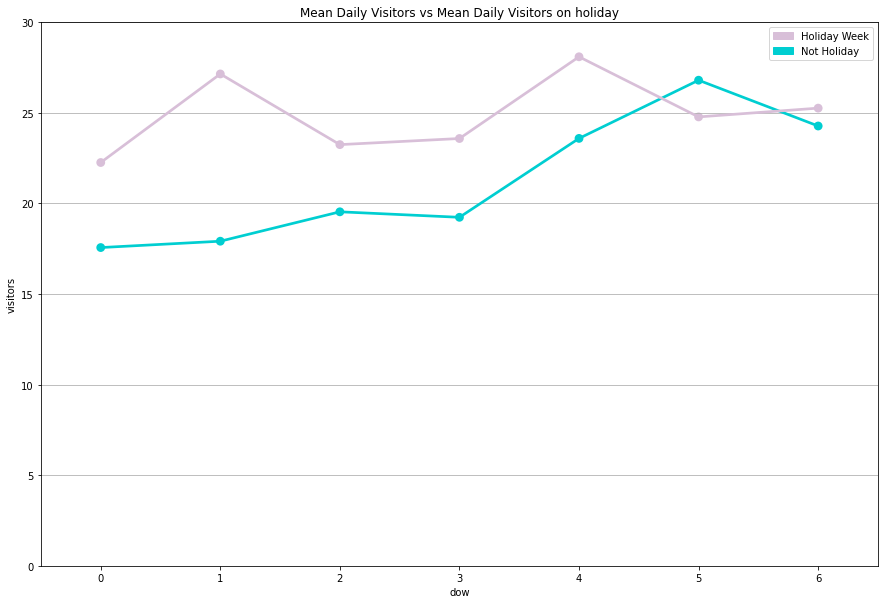

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

air_1 = air_store_data
pvt_1 = air_1.groupby(['dow'])['visitors'].mean().reset_index()

air_2 = air_store_data.loc[air_store_data['holiday_flg'] == 1]
pvt_2 = air_2.groupby(['dow'])['visitors'].mean().reset_index()

holiday = mpatches.Patch(color='thistle', label='Holiday Week')
not_holiday = mpatches.Patch(color='darkturquoise', label='Not Holiday')

f, ax = plt.subplots(figsize=(15,10), sharey=False)
plt.legend(handles=[holiday, not_holiday])
plt.grid(True)
ax = sns.pointplot(pvt_1['dow'] ,pvt_1['visitors'], color='darkturquoise')
ax = sns.pointplot(pvt_2['dow'] ,pvt_2['visitors'], color='thistle')

ax.set_title('Mean Daily Visitors vs Mean Daily Visitors on holiday')
ax.set_ylim(0, 30)

In [29]:
air_1 = air_store_data[air_store_data['air_store_id'] == 'air_ba937bf13d40fb24']
air_2 = air_store_data[air_store_data['air_store_id'] == 'air_cb935ff8610ba3d3']
air_3 = air_store_data[air_store_data['air_store_id'] == 'air_f96765e800907c77']
# air_3 = air_store_data[air_store_data['air_store_id'] == 'air_831658500aa7c846']
# air_4 = air_store_data[air_store_data['air_store_id'] == 'air_7420042ff75f9aca']

mean_1 = air_1['visitors'].mean()
mean_2 = air_2['visitors'].mean()
mean_3 = air_3['visitors'].mean()

df_air = pd.DataFrame({'Restaurants':['Air_1', 'Air_2', 'Air_3'],
                             'Visitors_Mean':[mean_1, mean_2, mean_3]})

Text(0.5, 0, 'Date')

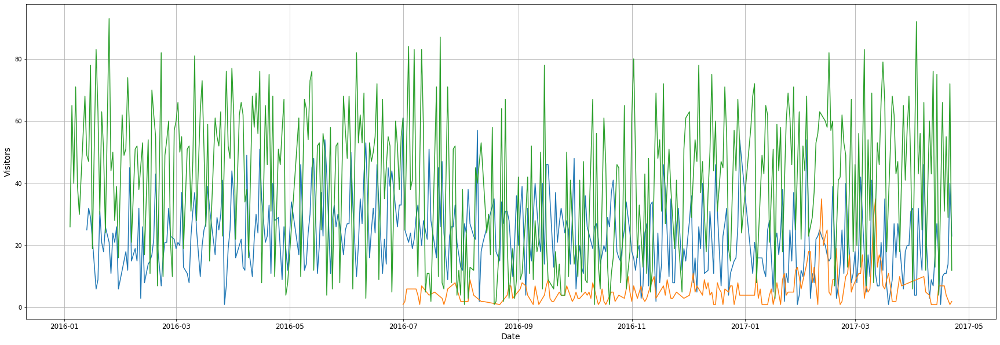

In [32]:
# plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(30,10))

# air_1['count'] = pd.to_numeric(air_1['visitors'])
plt.plot(air_1['visit_date'], air_1['visitors'])
plt.plot(air_2['visit_date'], air_2['visitors'])
plt.plot(air_3['visit_date'], air_3['visitors'])
plt.grid()
plt.ylabel('Visitors', fontsize=14)
plt.xlabel('Date', fontsize=14)

* 3개의 식당을 뽑아 일별 손님 수를 그래프로 그려보았다. 세 식당이 평균적으로 오는 손님 수가 다르다는 것을 확인할 수 있다.
* 식당 손님을 예측하는데 가장 중요한 변수는 visitors이다.
* 하지만 식당에서 한 번에 받아들일 수 있는 손님이 식당마다 차이가 있다.
* 그래서 식당 손님들의 평균, 최소, 최대, 중간값 지표등이 중요한 feature가 될 것이다.

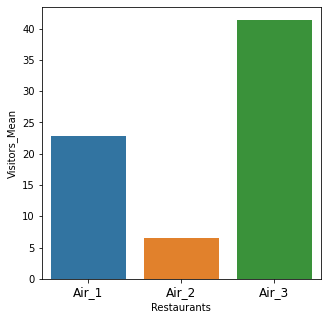

In [36]:
mean_1 = air_1['visitors'].mean()
mean_2 = air_2['visitors'].mean()
mean_3 = air_3['visitors'].mean()

df_air = pd.DataFrame({'Restaurants':['Air_1', 'Air_2', 'Air_3'],
                             'Visitors_Mean':[mean_1, mean_2, mean_3]})
                             
plt.figure(figsize=(5, 5))

sns.barplot(df_air.Restaurants, df_air.Visitors_Mean)

In [37]:
stores = pd.merge(stores, air_store, how='left', on=['air_store_id']) 
stores.head(1)

,air_store_id,dow,min_visitors,mean_visitors,median_visitors,max_visitors,count_observations,air_genre_name_x,air_area_name_x,latitude_x,longitude_x,air_genre_name_y,air_area_name_y,latitude_y,longitude_y
0,air_00a91d42b08b08d9,0,1.0,22.457143,19.0,47.0,35.0,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595,Italian/French,Tōkyō-to Chiyoda-ku Kudanminami,35.694003,139.753595


In [39]:
air_store_data = pd.merge(air_store_data, stores, how='left', on=['air_store_id','dow']) 
air_store_data.head(1)

,air_store_id,visit_date,visitors,dow,year,month,day_of_week,holiday_flg,min_visitors,mean_visitors,median_visitors,max_visitors,count_observations,air_genre_name_x,air_area_name_x,latitude_x,longitude_x,air_genre_name_y,air_area_name_y,latitude_y,longitude_y,air_genre_name,air_area_name
0,air_ba937bf13d40fb24,2016-01-13,25,2,2016,1,6,0,7.0,23.84375,25.0,57.0,64.0,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,Dining bar,Tōkyō-to Minato-ku Shibakōen,35.658068,139.751599,4.0,62.0


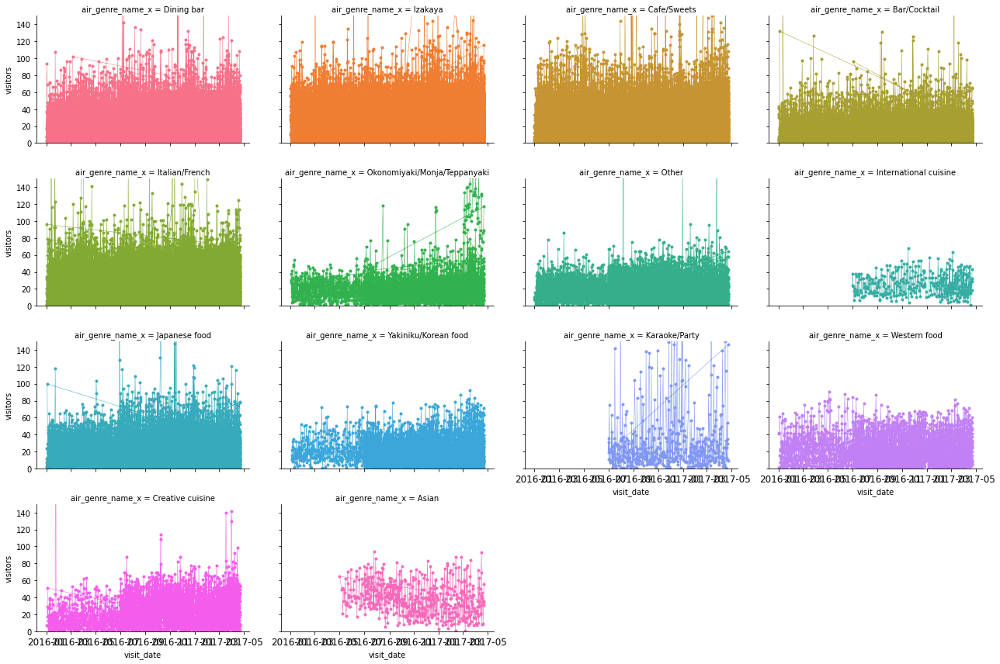

In [46]:
ax = sns.FacetGrid(air_store_data, col="air_genre_name_x", col_wrap=4, size=3, hue='air_genre_name_x',margin_titles=True,
                  aspect=1.5, palette='husl', ylim=(0,150))
ax = ax.map(plt.plot, "visit_date", "visitors",  marker=".", linewidth = 0.5)


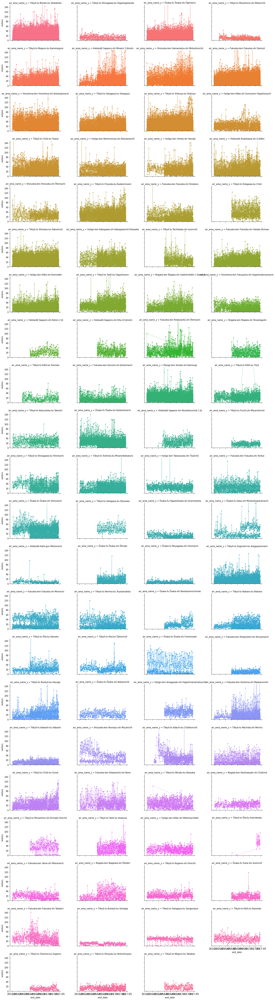

In [47]:
ax = sns.FacetGrid(air_store_data, col="air_area_name_y", col_wrap=4, size=3, hue='air_area_name_y',margin_titles=True,
                  aspect=1.5, palette='husl', ylim=(0,150))
ax = ax.map(plt.plot, "visit_date", "visitors",  marker=".", linewidth = 0.5)

_참조_

[Surprised Yet? - Part2 - (LB: 0.503)](https://www.kaggle.com/jdpaletto/surprised-yet-part2-lb-0-503)

[Recruit Visual EDA Itadakimasu!](https://www.kaggle.com/faizalabdkadir/recruit-visual-eda-itadakimasu)

[Recruit Restaurant Visitor Forecasting](https://www.kaggle.com/c/recruit-restaurant-visitor-forecasting/data)

[Be my guest - Recruit Restaurant EDA](https://www.kaggle.com/headsortails/be-my-guest-recruit-restaurant-eda)